In [21]:
import glob
import cv2
import numpy as np
import matplotlib.pyplot as plt
import keras
import h5py

from keras.models import Model
from keras.layers import Input, Convolution2D, MaxPooling2D, Dropout, GlobalAveragePooling2D, merge, Activation, ZeroPadding2D
from keras.layers import AveragePooling2D, Flatten
from keras.layers.normalization import BatchNormalization
from keras.optimizers import Adam
from keras.models import Sequential
import keras.backend as K
from keras.utils.np_utils import to_categorical
from scipy.ndimage.interpolation import rotate, shift

In [22]:
def adjust_gamma(image, gamma=2.0):
    # build a lookup table mapping the pixel values [0, 255] to
    # their adjusted gamma values

    invGamma = 1.0 / gamma
    table = np.array([((i / 255.0) ** invGamma) * 255
    for i in np.arange(0, 256)]).astype("uint8")
    return cv2.LUT(image, table)

In [23]:
def random_jitter(cpy):
    if np.random.random() > .5:
        cpy = shift(cpy, shift=(np.random.randint(-2,2,3)))
    if np.random.random() > .5:
        cpy = rotate(cpy, angle = np.random.randint(-15,15,1), reshape=False)
    if np.random.random() > .5:
        cpy = np.fliplr(cpy)
    #if np.random.random() > .5:
    #    cpy = adjust_gamma(cpy, 2.0)
    return cpy

In [24]:
X_train = []
x_label = []
X_test = []
x_test_label = []

IMAGE_WIDTH = 227
IMAGE_HEIGHT = 227

for img_class, directory in enumerate(['carla/train/red', 'carla/train/yellow', 'carla/train/green', 'carla/train/no']):
    for i, file_name in enumerate(glob.glob("{}/*.*".format(directory))):
        file = cv2.imread(file_name)
        file = cv2.cvtColor(file, cv2.COLOR_BGR2RGB);
        resized = cv2.resize(file, (IMAGE_WIDTH, IMAGE_HEIGHT))

        X_train.append(resized/255.)
        x_label.append(img_class)
        
print(np.array(x_label).shape)
print(np.array(X_train).shape)

(1488,)
(1488, 227, 227, 3)


In [25]:
X_train_copy = np.copy(np.array(X_train))
x_label_copy = np.copy(np.array(x_label))

X_train_jittered = [];
x_label_jittered = [];


def jitter_dataset(image_data):
#     jittered_images = []
    for i, img in enumerate(image_data):
        jittered_image = random_jitter(img)
        X_train_jittered.append(jittered_image)
        x_label_jittered.append(x_label_copy[i])
        

jitter_dataset(X_train_copy)
jitter_dataset(X_train_copy)
jitter_dataset(X_train_copy)

X_train_jittered = np.array(X_train_jittered)
x_label_jittered = np.array(x_label_jittered)

X_train_extra = np.concatenate((X_train_copy, X_train_jittered), axis=0)
print(X_train_extra.shape)

x_label_extra = np.concatenate((x_label_copy, x_label_jittered), axis=0)
print(x_label_extra.shape)

(5952, 227, 227, 3)
(5952,)


In [26]:
X_train = np.array(X_train)
x_label = np.array(x_label)

for img_class, directory in enumerate(['carla/test/red', 'carla/test/yellow', 'carla/test/green', 'carla/test/no']):
    for i, file_name in enumerate(glob.glob("{}/*.*".format(directory))):
        file = cv2.imread(file_name)

        file = cv2.cvtColor(file, cv2.COLOR_BGR2RGB);
#         resized = resizeAndCrop(file, (IMAGE_WIDTH,IMAGE_HEIGHT))
        resized = cv2.resize(file, (IMAGE_WIDTH, IMAGE_HEIGHT))
        X_test.append(resized/255.)
        x_test_label.append(img_class)
        
X_test = np.array(X_test)
x_test_label = np.array(x_test_label)

In [27]:
nb_classes = 4
image_shape = [IMAGE_HEIGHT, IMAGE_WIDTH, 3]
print(image_shape)

[227, 227, 3]


In [28]:
def FireModule(s_1x1, e_1x1, e_3x3, name):
    """
        Fire module for the SqueezeNet model. 
        Implements the expand layer, which has a mix of 1x1 and 3x3 filters, 
        by using two conv layers concatenated in the channel dimension. 
        Returns a callable function
    """
    def layer(x):
        squeeze = Convolution2D(s_1x1, 1, 1, activation='relu', init='he_normal', name=name+'_squeeze')(x)
        squeeze = BatchNormalization(name=name+'_squeeze_bn')(squeeze)
        # Set border_mode to same to pad output of expand_3x3 with zeros.
        # Needed to merge layers expand_1x1 and expand_3x3.
        expand_1x1 = Convolution2D(e_1x1, 1, 1, border_mode='same', activation='relu', init='he_normal', name=name+'_expand_1x1')(squeeze)
        # expand_1x1 = BatchNormalization(name=name+'_expand_1x1_bn')(expand_1x1)

        # expand_3x3 = ZeroPadding2D(padding=(1, 1), name=name+'_expand_3x3_padded')(squeeze)
        expand_3x3 = Convolution2D(e_3x3, 3, 3, border_mode='same', activation='relu', init='he_normal', name=name+'_expand_3x3')(squeeze)
        # expand_3x3 = BatchNormalization(name=name+'_expand_3x3_bn')(expand_3x3)

        expand_merge = merge([expand_1x1, expand_3x3], mode='concat', concat_axis=3, name=name+'_expand_merge')
        return expand_merge
    return layer

def SqueezeNet(nb_classes, input_shape=(227, 227, 3)): 
    # Use input shape (227, 227, 3) instead of the (224, 224, 3) shape cited in the paper. 
    # This results in conv1 output shape = (None, 111, 111, 96), same as in the paper. 
    input_image = Input(shape=input_shape)
    conv1 = Convolution2D(96, 7, 7, activation='relu', subsample=(2, 2), init='he_normal', name='conv1')(input_image)
    # conv1 = BatchNormalization(name='conv1_bn')(conv1)
    # maxpool1 output shape = (?, 55, 55, 96)
    maxpool1 = MaxPooling2D(pool_size=(3, 3), strides=(2, 2), name='maxpool1')(conv1)

    # fire2 output shape = (?, 55, 55, 128)
    fire2 = FireModule(s_1x1=16, e_1x1=64, e_3x3=64, name='fire2')(maxpool1)
    # fire3 output shape = (?, 55, 55, 128)
    fire3 = FireModule(s_1x1=16, e_1x1=64, e_3x3=64, name='fire3')(fire2)
    # fire4 output shape = (?, 55, 55, 256)
    fire4 = FireModule(s_1x1=32, e_1x1=128, e_3x3=128, name='fire4')(fire3)
    # maxpool4 output shape = (?, 27, 27, 256)
    maxpool4 = MaxPooling2D(pool_size=(3, 3), strides=(2, 2), name='maxpool4')(fire4)
    # fire5 output shape = (?, 27, 27, 384)
    fire5 = FireModule(s_1x1=32, e_1x1=128, e_3x3=128, name='fire5')(maxpool4)
    # fire6 output shape = (?, 27, 27, 384)
    fire6 = FireModule(s_1x1=48, e_1x1=192, e_3x3=192, name='fire6')(fire5)
    # fire7 output shape = (?, 27, 27, 384)
    fire7 = FireModule(s_1x1=48, e_1x1=192, e_3x3=192, name='fire7')(fire6)
    # fire8 output shape = (?, 27, 27, 512)
    fire8 = FireModule(s_1x1=64, e_1x1=256, e_3x3=256, name='fire8')(fire7)
    # maxpool8 output shape = (?, 13, 13, 384). The paper states this output is (13, 13, 512)?
    maxpool8 = MaxPooling2D(pool_size=(3, 3), strides=(2, 2), name='maxpool8')(fire7)
    # fire9 output shape = (?, 13, 13, 512)
    fire9 = FireModule(s_1x1=64, e_1x1=256, e_3x3=256, name='fire9')(maxpool8)
    # Dropout after fire9 module.
    fire9_dropout = Dropout(p=0.5, name='fire9_dropout')(fire9)

    # conv10 output shape = (?, 13, 13, 6)
    conv10 = Convolution2D(nb_classes, 1, 1, activation='relu', init='he_normal', name='conv10')(fire9_dropout)
    conv10 = BatchNormalization(name='conv10_bn')(conv10)
    # avgpool10, softmax output shape = (?, nb_classes)
    avgpool10 = GlobalAveragePooling2D(name='avgpool10')(conv10)
    # avgpool10 = AveragePooling2D(pool_size=(13, 13), strides=(1, 1), name='avgpool10')(conv10)
    # avgpool10 = Flatten(name='flatten')(avgpool10)
    softmax = Activation('softmax', name='softmax')(avgpool10)

    model = Model(input=input_image, output=[softmax])
    return model

In [29]:
categorical_labels = to_categorical(x_label_extra)
categorical_test_labels = to_categorical(x_test_label)

In [31]:
model = SqueezeNet(nb_classes, (IMAGE_WIDTH, IMAGE_HEIGHT, 3))
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
model.fit(X_train_extra, categorical_labels, batch_size=32, nb_epoch=10, verbose=True, validation_split=0.2, shuffle=True)
score = model.evaluate(X_train_extra, categorical_labels, verbose=0)
print (score)

Train on 4761 samples, validate on 1191 samples
Epoch 1/10
4761/4761 [==============================] - 642s - loss: 0.9544 - acc: 0.6566 - val_loss: 1.0484 - val_acc: 0.6213
Epoch 2/10
4761/4761 [==============================] - 615s - loss: 0.6503 - acc: 0.8385 - val_loss: 0.5271 - val_acc: 0.8816
Epoch 3/10
4761/4761 [==============================] - 617s - loss: 0.4743 - acc: 0.9267 - val_loss: 0.3710 - val_acc: 0.9253
Epoch 4/10
4761/4761 [==============================] - 654s - loss: 0.3569 - acc: 0.9561 - val_loss: 0.5655 - val_acc: 0.7926
Epoch 5/10
4761/4761 [==============================] - 627s - loss: 0.2826 - acc: 0.9729 - val_loss: 0.2787 - val_acc: 0.9614
Epoch 6/10
4761/4761 [==============================] - 635s - loss: 0.2320 - acc: 0.9784 - val_loss: 0.2073 - val_acc: 0.9572
Epoch 7/10
4761/4761 [==============================] - 622s - loss: 0.1932 - acc: 0.9811 - val_loss: 0.2427 - val_acc: 0.9463
Epoch 8/10
4761/4761 [==============================] - 638s - 

373/373 [==============================] - 19s    


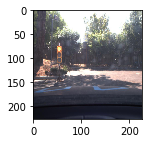

0 [ 0.64354861  0.18885641  0.12968408  0.03791089] [ 1.  0.  0.  0.]
0 0


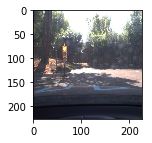

1 [ 0.70593458  0.16785876  0.08620839  0.03999822] [ 1.  0.  0.  0.]
0 0


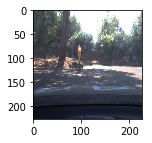

2 [ 0.86535877  0.08881781  0.02936162  0.01646185] [ 1.  0.  0.  0.]
0 0


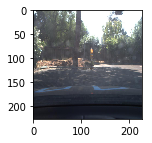

3 [ 0.81826884  0.1039061   0.05804937  0.01977576] [ 1.  0.  0.  0.]
0 0


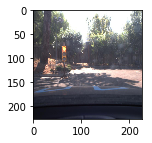

4 [ 0.65545267  0.18089487  0.11778207  0.04587041] [ 1.  0.  0.  0.]
0 0


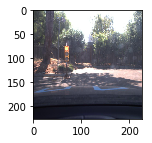

5 [ 0.79155594  0.09905047  0.07885206  0.03054158] [ 1.  0.  0.  0.]
0 0


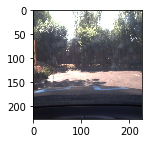

6 [ 0.22433269  0.21527445  0.09757777  0.46281517] [ 1.  0.  0.  0.]
3 0


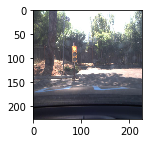

7 [ 0.50410074  0.17751242  0.2390615   0.0793253 ] [ 1.  0.  0.  0.]
0 0


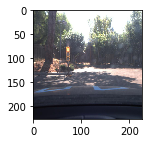

8 [ 0.77702194  0.12071732  0.07101557  0.03124516] [ 1.  0.  0.  0.]
0 0


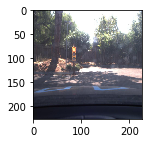

9 [ 0.8560006   0.07786041  0.04264407  0.0234949 ] [ 1.  0.  0.  0.]
0 0


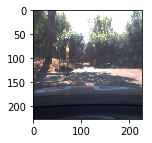

10 [ 0.78944117  0.12754282  0.05535059  0.02766544] [ 1.  0.  0.  0.]
0 0


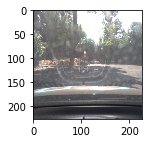

11 [ 0.7790457   0.17749928  0.02607714  0.01737796] [ 1.  0.  0.  0.]
0 0


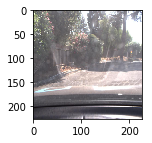

12 [ 0.65385562  0.07290161  0.16109449  0.11214826] [ 1.  0.  0.  0.]
0 0


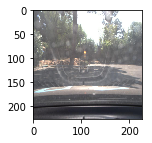

13 [ 0.7859751   0.17202178  0.02521482  0.01678829] [ 1.  0.  0.  0.]
0 0


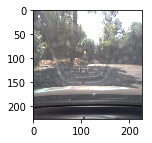

14 [ 0.76665109  0.18568237  0.02918611  0.01848042] [ 1.  0.  0.  0.]
0 0


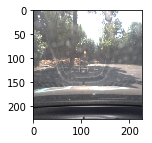

15 [ 0.78884804  0.16734135  0.02669541  0.01711511] [ 1.  0.  0.  0.]
0 0


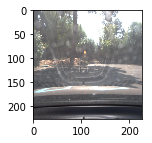

16 [ 0.79413664  0.16240017  0.02646384  0.01699942] [ 1.  0.  0.  0.]
0 0


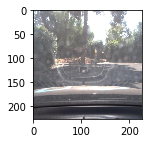

17 [ 0.83729708  0.07210977  0.0657691   0.02482416] [ 1.  0.  0.  0.]
0 0


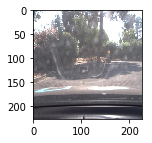

18 [ 0.74541479  0.05389098  0.16378313  0.03691109] [ 1.  0.  0.  0.]
0 0


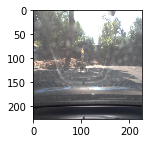

19 [ 0.89822638  0.05038945  0.03712155  0.01426267] [ 1.  0.  0.  0.]
0 0


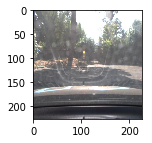

20 [ 0.84049845  0.10725424  0.03483658  0.01741077] [ 1.  0.  0.  0.]
0 0


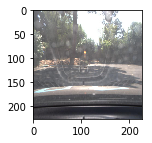

21 [ 0.77884299  0.17432162  0.02868417  0.01815117] [ 1.  0.  0.  0.]
0 0


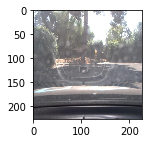

22 [ 0.84594542  0.06228624  0.06814341  0.02362491] [ 1.  0.  0.  0.]
0 0


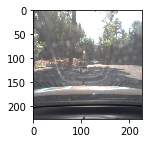

23 [ 0.82113719  0.12910426  0.03222657  0.01753196] [ 1.  0.  0.  0.]
0 0


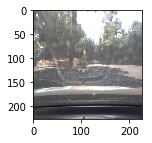

24 [ 0.81559765  0.13137971  0.0346814   0.01834125] [ 1.  0.  0.  0.]
0 0


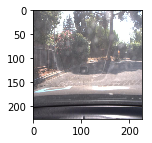

25 [ 0.70126146  0.07351058  0.16507003  0.06015787] [ 1.  0.  0.  0.]
0 0


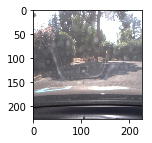

26 [ 0.84550095  0.04792144  0.07699681  0.02958082] [ 1.  0.  0.  0.]
0 0


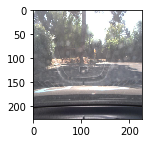

27 [ 0.85449344  0.06455398  0.05820693  0.02274559] [ 1.  0.  0.  0.]
0 0


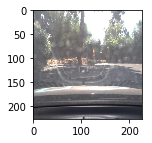

28 [ 0.79110271  0.07234089  0.10465658  0.03189987] [ 1.  0.  0.  0.]
0 0


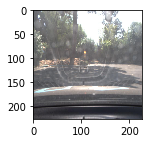

29 [ 0.78780085  0.16545844  0.02882818  0.01791267] [ 1.  0.  0.  0.]
0 0


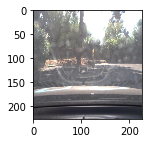

30 [ 0.81911635  0.07994393  0.07345741  0.02748235] [ 1.  0.  0.  0.]
0 0


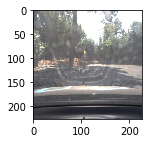

31 [ 0.81309229  0.13905233  0.03026153  0.01759381] [ 1.  0.  0.  0.]
0 0


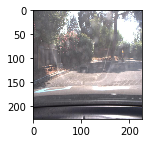

32 [ 0.84677178  0.04457245  0.06316316  0.0454926 ] [ 1.  0.  0.  0.]
0 0


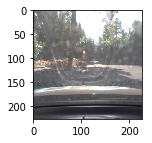

33 [ 0.84821266  0.102814    0.03243712  0.0165362 ] [ 1.  0.  0.  0.]
0 0


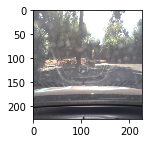

34 [ 0.82459337  0.07151096  0.07667693  0.02721877] [ 1.  0.  0.  0.]
0 0


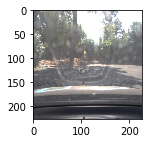

35 [ 0.80054617  0.15383035  0.028107    0.01751641] [ 1.  0.  0.  0.]
0 0


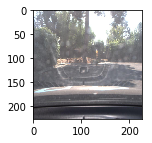

36 [ 0.79829651  0.06668096  0.10367812  0.03134439] [ 1.  0.  0.  0.]
0 0


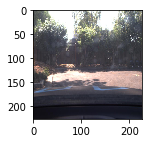

37 [ 0.22651607  0.18574734  0.05060651  0.53713012] [ 1.  0.  0.  0.]
3 0


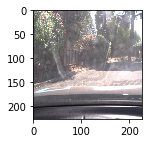

38 [ 0.50929189  0.07788531  0.08663552  0.32618725] [ 1.  0.  0.  0.]
0 0


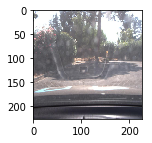

39 [ 0.83716261  0.04675362  0.08603413  0.03004957] [ 1.  0.  0.  0.]
0 0


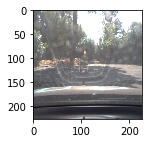

40 [ 0.76937807  0.18438558  0.02794616  0.01829023] [ 1.  0.  0.  0.]
0 0


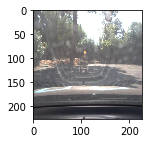

41 [ 0.78621286  0.17019235  0.02661829  0.01697651] [ 1.  0.  0.  0.]
0 0


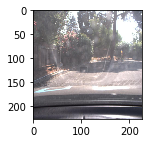

42 [ 0.84645265  0.04296018  0.06779382  0.04279331] [ 1.  0.  0.  0.]
0 0


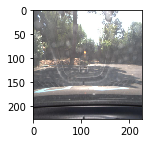

43 [ 0.77717841  0.17835057  0.02690729  0.0175638 ] [ 1.  0.  0.  0.]
0 0


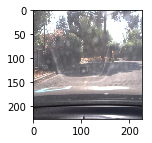

44 [ 0.7505281   0.0827206   0.12820141  0.03854994] [ 1.  0.  0.  0.]
0 0


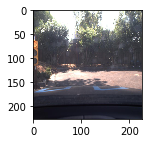

45 [ 0.62429339  0.1738275   0.04661144  0.15526766] [ 1.  0.  0.  0.]
0 0


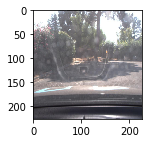

46 [ 0.80665463  0.04715916  0.11426914  0.03191712] [ 1.  0.  0.  0.]
0 0


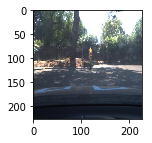

47 [ 0.61878324  0.20820683  0.12404046  0.04896954] [ 1.  0.  0.  0.]
0 0


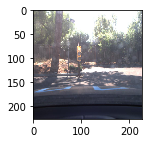

48 [ 0.67368776  0.08157155  0.14654417  0.09819645] [ 1.  0.  0.  0.]
0 0


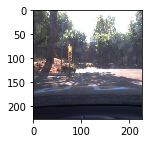

49 [ 0.82354993  0.09161539  0.05659176  0.02824296] [ 1.  0.  0.  0.]
0 0


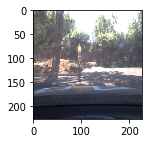

50 [ 0.72169757  0.08721538  0.1169448   0.07414214] [ 1.  0.  0.  0.]
0 0


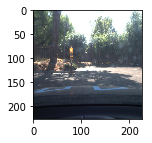

51 [ 0.75184709  0.12429413  0.09364402  0.03021481] [ 1.  0.  0.  0.]
0 0


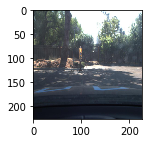

52 [ 0.75117785  0.1972328   0.0330263   0.0185631 ] [ 1.  0.  0.  0.]
0 0


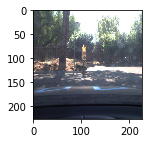

53 [ 0.44961953  0.09716488  0.37237355  0.08084211] [ 1.  0.  0.  0.]
0 0


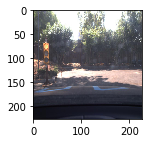

54 [ 0.66210032  0.19689994  0.08746921  0.05353051] [ 1.  0.  0.  0.]
0 0


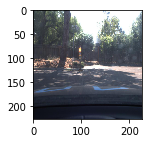

55 [ 0.8414281   0.11166348  0.03035997  0.0165485 ] [ 1.  0.  0.  0.]
0 0


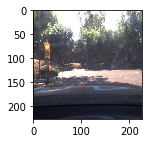

56 [ 0.55616724  0.25721723  0.13352646  0.05308913] [ 1.  0.  0.  0.]
0 0


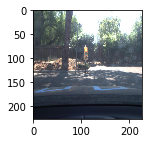

57 [ 0.69278884  0.0771178   0.15678151  0.07331184] [ 1.  0.  0.  0.]
0 0


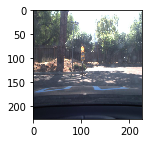

58 [ 0.40910581  0.1216636   0.39117816  0.07805251] [ 1.  0.  0.  0.]
0 0


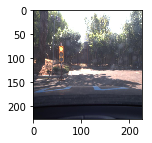

59 [ 0.60286522  0.21589719  0.13882063  0.04241695] [ 1.  0.  0.  0.]
0 0


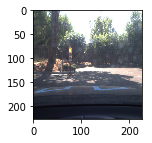

60 [ 0.76037085  0.11247871  0.0964874   0.03066307] [ 1.  0.  0.  0.]
0 0


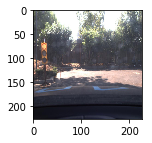

61 [ 0.43989995  0.35997981  0.09534208  0.10477817] [ 1.  0.  0.  0.]
0 0


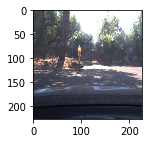

62 [ 0.86400563  0.08544335  0.03359699  0.01695416] [ 1.  0.  0.  0.]
0 0


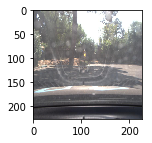

63 [ 0.00561787  0.99007154  0.00291436  0.00139614] [ 0.  1.  0.  0.]
1 1


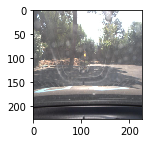

64 [ 0.00497245  0.9918046   0.00208449  0.0011385 ] [ 0.  1.  0.  0.]
1 1


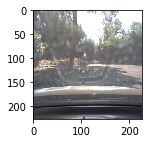

65 [ 0.0051496   0.99163669  0.00205646  0.0011573 ] [ 0.  1.  0.  0.]
1 1


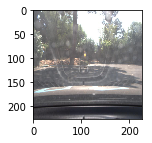

66 [ 0.00666365  0.98892981  0.00283693  0.00156972] [ 0.  1.  0.  0.]
1 1


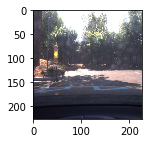

67 [  1.01714605e-03   9.95670795e-01   2.42239120e-03   8.89637275e-04] [ 0.  1.  0.  0.]
1 1


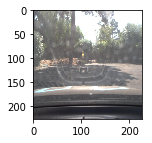

68 [ 0.00296945  0.99347878  0.00228434  0.00126744] [ 0.  1.  0.  0.]
1 1


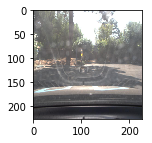

69 [  2.78719841e-03   9.94719028e-01   1.57398358e-03   9.19700600e-04] [ 0.  1.  0.  0.]
1 1


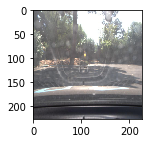

70 [ 0.00763261  0.98744339  0.00317137  0.0017526 ] [ 0.  1.  0.  0.]
1 1


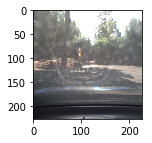

71 [  2.58388976e-03   9.94342208e-01   2.28637084e-03   7.87381956e-04] [ 0.  1.  0.  0.]
1 1


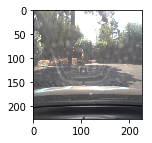

72 [ 0.00330537  0.99363577  0.00171244  0.00134641] [ 0.  1.  0.  0.]
1 1


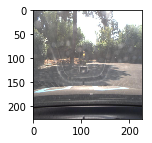

73 [ 0.0051623   0.98938739  0.00350569  0.00194464] [ 0.  1.  0.  0.]
1 1


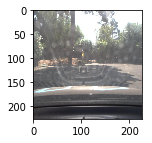

74 [ 0.00381066  0.99271637  0.00192426  0.00154867] [ 0.  1.  0.  0.]
1 1


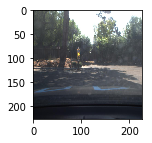

75 [  1.70931302e-03   9.95910287e-01   1.78236421e-03   5.97993610e-04] [ 0.  1.  0.  0.]
1 1


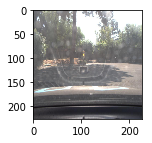

76 [ 0.00281681  0.99405199  0.00202677  0.00110443] [ 0.  1.  0.  0.]
1 1


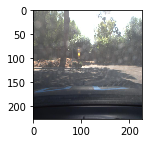

77 [  1.97141082e-03   9.95666385e-01   1.71775045e-03   6.44477142e-04] [ 0.  1.  0.  0.]
1 1


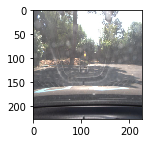

78 [ 0.00710774  0.98833919  0.00291585  0.00163718] [ 0.  1.  0.  0.]
1 1


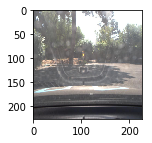

79 [ 0.00293634  0.994313    0.00167087  0.00107985] [ 0.  1.  0.  0.]
1 1


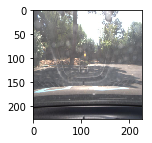

80 [ 0.0070507   0.98836809  0.00294523  0.00163598] [ 0.  1.  0.  0.]
1 1


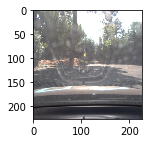

81 [ 0.00559018  0.9904846   0.00259172  0.00133356] [ 0.  1.  0.  0.]
1 1


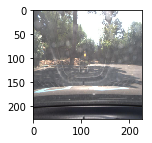

82 [ 0.00726374  0.9881478   0.00293057  0.00165789] [ 0.  1.  0.  0.]
1 1


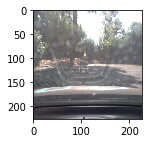

83 [ 0.00712678  0.98811042  0.00311149  0.0016513 ] [ 0.  1.  0.  0.]
1 1


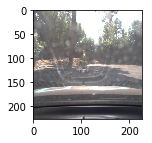

84 [ 0.00607266  0.98933357  0.00312669  0.0014671 ] [ 0.  1.  0.  0.]
1 1


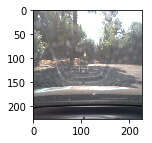

85 [ 0.00664501  0.98891968  0.00288099  0.00155442] [ 0.  1.  0.  0.]
1 1


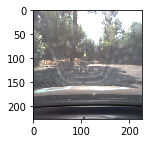

86 [ 0.00681439  0.98890603  0.00271723  0.00156227] [ 0.  1.  0.  0.]
1 1


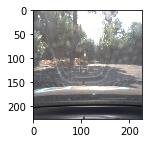

87 [ 0.00731284  0.98815829  0.0028809   0.00164798] [ 0.  1.  0.  0.]
1 1


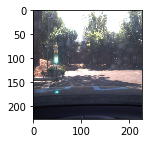

88 [ 0.01763278  0.04856062  0.92157757  0.01222908] [ 0.  0.  1.  0.]
2 2


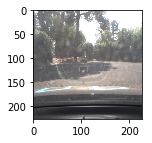

89 [ 0.04342635  0.12837429  0.80057144  0.02762791] [ 0.  0.  1.  0.]
2 2


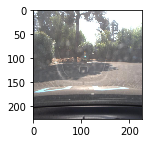

90 [ 0.04745932  0.14100249  0.782336    0.02920219] [ 0.  0.  1.  0.]
2 2


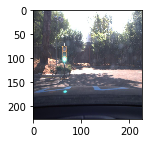

91 [ 0.02398912  0.07010647  0.88987094  0.01603353] [ 0.  0.  1.  0.]
2 2


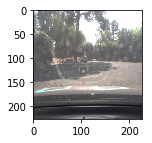

92 [ 0.04015274  0.12283373  0.81082916  0.02618441] [ 0.  0.  1.  0.]
2 2


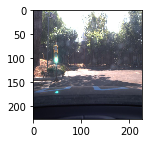

93 [ 0.01400868  0.03557798  0.93919605  0.01121728] [ 0.  0.  1.  0.]
2 2


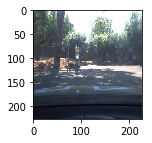

94 [ 0.02935439  0.02153796  0.93911296  0.00999465] [ 0.  0.  1.  0.]
2 2


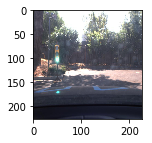

95 [ 0.01250827  0.02261358  0.9561547   0.00872343] [ 0.  0.  1.  0.]
2 2


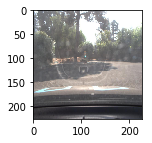

96 [ 0.04135003  0.12480211  0.80685318  0.02699464] [ 0.  0.  1.  0.]
2 2


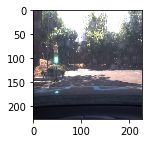

97 [ 0.01335066  0.03342986  0.94248962  0.01072991] [ 0.  0.  1.  0.]
2 2


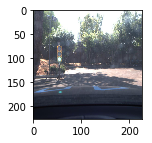

98 [ 0.0116648   0.0260831   0.95340061  0.00885155] [ 0.  0.  1.  0.]
2 2


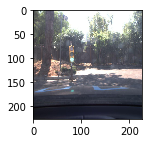

99 [ 0.05064448  0.12349713  0.8006348   0.02522359] [ 0.  0.  1.  0.]
2 2


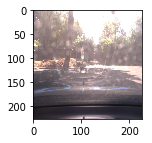

100 [ 0.07039487  0.06257467  0.83120286  0.03582762] [ 0.  0.  1.  0.]
2 2


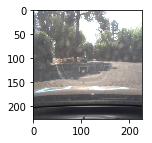

101 [ 0.0411458   0.12311322  0.8091687   0.0265723 ] [ 0.  0.  1.  0.]
2 2


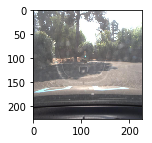

102 [ 0.0412197   0.12850147  0.80324829  0.02703045] [ 0.  0.  1.  0.]
2 2


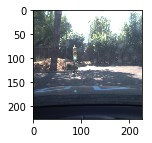

103 [ 0.02523243  0.01996956  0.945382    0.00941602] [ 0.  0.  1.  0.]
2 2


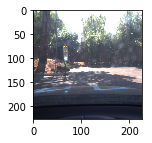

104 [ 0.01543092  0.02106761  0.95396018  0.00954129] [ 0.  0.  1.  0.]
2 2


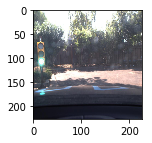

105 [ 0.0426892   0.0494694   0.73324072  0.17460072] [ 0.  0.  1.  0.]
2 2


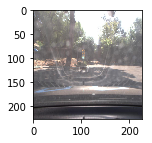

106 [ 0.04174744  0.03213915  0.91310996  0.0130035 ] [ 0.  0.  1.  0.]
2 2


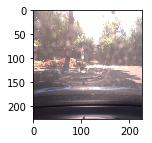

107 [ 0.0605531   0.05405684  0.85954821  0.02584185] [ 0.  0.  1.  0.]
2 2


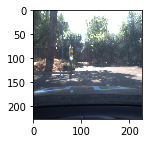

108 [ 0.01436534  0.01911779  0.95934713  0.00716978] [ 0.  0.  1.  0.]
2 2


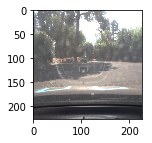

109 [ 0.04076607  0.12393782  0.80807954  0.02721654] [ 0.  0.  1.  0.]
2 2


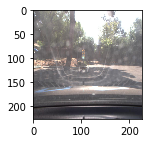

110 [ 0.0406098   0.03289475  0.91341966  0.01307585] [ 0.  0.  1.  0.]
2 2


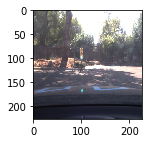

111 [ 0.04107885  0.03178338  0.91289681  0.01424096] [ 0.  0.  1.  0.]
2 2


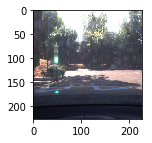

112 [ 0.01425672  0.03983981  0.93381959  0.01208389] [ 0.  0.  1.  0.]
2 2


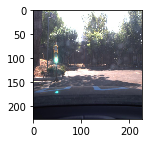

113 [ 0.01856679  0.06698892  0.89947748  0.01496682] [ 0.  0.  1.  0.]
2 2


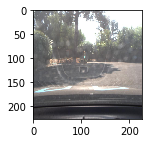

114 [ 0.04038304  0.14947213  0.78594464  0.02420015] [ 0.  0.  1.  0.]
2 2


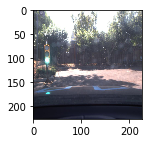

115 [ 0.03503748  0.0812878   0.84657383  0.03710088] [ 0.  0.  1.  0.]
2 2


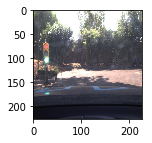

116 [ 0.13021609  0.15487985  0.66303939  0.05186469] [ 0.  0.  1.  0.]
2 2


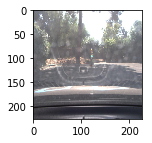

117 [ 0.06054842  0.0502428   0.87057298  0.01863582] [ 0.  0.  1.  0.]
2 2


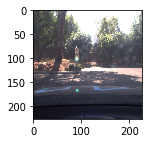

118 [ 0.0246736   0.02323717  0.94300747  0.00908164] [ 0.  0.  1.  0.]
2 2


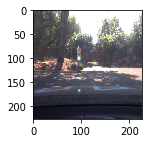

119 [ 0.04382899  0.03593817  0.90740079  0.01283201] [ 0.  0.  1.  0.]
2 2


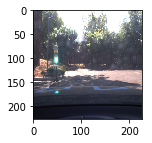

120 [ 0.01790299  0.0465669   0.92184937  0.01368069] [ 0.  0.  1.  0.]
2 2


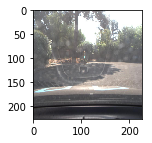

121 [ 0.0386889   0.17245416  0.7650677   0.02378929] [ 0.  0.  1.  0.]
2 2


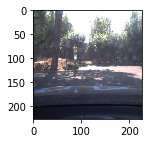

122 [ 0.0206132   0.02353441  0.94720078  0.0086517 ] [ 0.  0.  1.  0.]
2 2


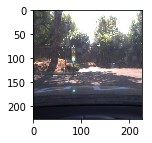

123 [ 0.01834419  0.02553366  0.94836652  0.00775559] [ 0.  0.  1.  0.]
2 2


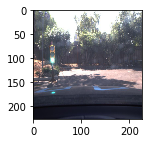

124 [ 0.01422804  0.03431412  0.9393214   0.01213642] [ 0.  0.  1.  0.]
2 2


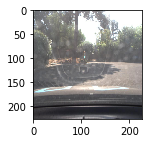

125 [ 0.04064375  0.17347224  0.76193029  0.02395378] [ 0.  0.  1.  0.]
2 2


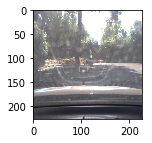

126 [ 0.04455091  0.04368103  0.89624494  0.01552307] [ 0.  0.  1.  0.]
2 2


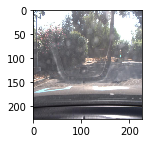

127 [ 0.05476384  0.02374944  0.90429652  0.01719015] [ 0.  0.  1.  0.]
2 2


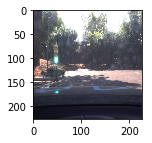

128 [ 0.01767848  0.05401782  0.91486245  0.0134412 ] [ 0.  0.  1.  0.]
2 2


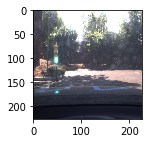

129 [ 0.01691383  0.04832764  0.92185223  0.01290628] [ 0.  0.  1.  0.]
2 2


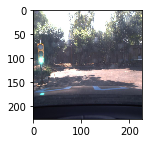

130 [ 0.03831412  0.06926642  0.86080432  0.03161518] [ 0.  0.  1.  0.]
2 2


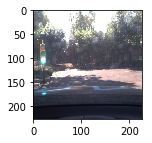

131 [ 0.04443827  0.07235491  0.84910697  0.03409989] [ 0.  0.  1.  0.]
2 2


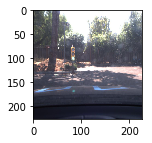

132 [ 0.01451432  0.01568845  0.96286017  0.00693704] [ 0.  0.  1.  0.]
2 2


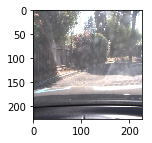

133 [ 0.17799369  0.10190928  0.45776471  0.26233235] [ 0.  0.  1.  0.]
2 2


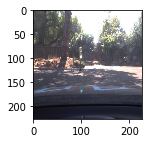

134 [ 0.0377697   0.02890693  0.91901964  0.0143037 ] [ 0.  0.  1.  0.]
2 2


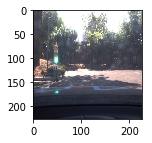

135 [ 0.01656293  0.05416046  0.916224    0.01305262] [ 0.  0.  1.  0.]
2 2


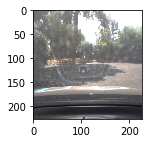

136 [ 0.05427142  0.3323735   0.5847261   0.02862898] [ 0.  0.  1.  0.]
2 2


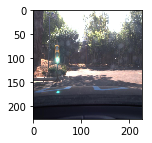

137 [ 0.01400473  0.02317698  0.95345849  0.00935981] [ 0.  0.  1.  0.]
2 2


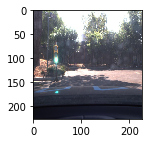

138 [ 0.01729364  0.05079478  0.91854787  0.01336374] [ 0.  0.  1.  0.]
2 2


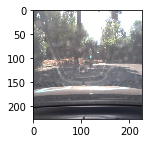

139 [ 0.05400022  0.06235319  0.86410618  0.01954037] [ 0.  0.  1.  0.]
2 2


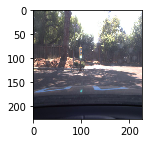

140 [ 0.03153365  0.02561418  0.93135619  0.01149599] [ 0.  0.  1.  0.]
2 2


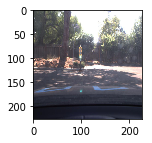

141 [ 0.04103724  0.03380144  0.91198295  0.0131783 ] [ 0.  0.  1.  0.]
2 2


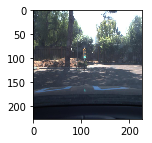

142 [ 0.01975845  0.02623762  0.94513863  0.00886531] [ 0.  0.  1.  0.]
2 2


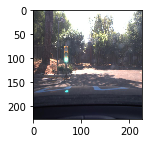

143 [ 0.02044769  0.05576207  0.91315162  0.01063863] [ 0.  0.  1.  0.]
2 2


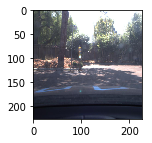

144 [ 0.03324782  0.02907362  0.92588919  0.01178933] [ 0.  0.  1.  0.]
2 2


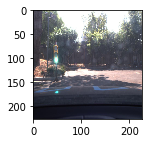

145 [ 0.01988339  0.06348685  0.90205079  0.01457894] [ 0.  0.  1.  0.]
2 2


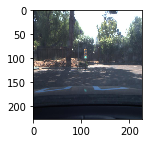

146 [ 0.02056543  0.04327907  0.92475992  0.01139558] [ 0.  0.  1.  0.]
2 2


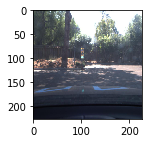

147 [ 0.03173039  0.04152001  0.91510147  0.01164812] [ 0.  0.  1.  0.]
2 2


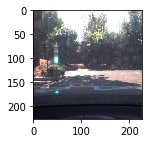

148 [ 0.02060482  0.06375229  0.90043682  0.01520601] [ 0.  0.  1.  0.]
2 2


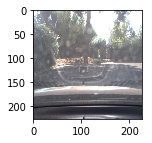

149 [ 0.06707965  0.03802379  0.87845957  0.01643704] [ 0.  0.  1.  0.]
2 2


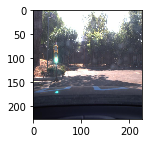

150 [ 0.01682356  0.05705533  0.91319662  0.0129245 ] [ 0.  0.  1.  0.]
2 2


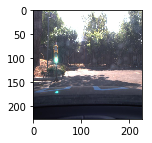

151 [ 0.02021649  0.05393764  0.90966511  0.01618074] [ 0.  0.  1.  0.]
2 2


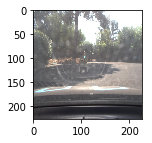

152 [ 0.03940751  0.16023016  0.77645528  0.02390704] [ 0.  0.  1.  0.]
2 2


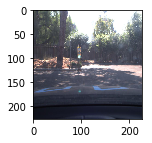

153 [ 0.04204815  0.03500791  0.90850067  0.01444338] [ 0.  0.  1.  0.]
2 2


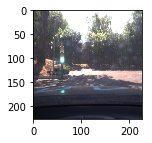

154 [ 0.02489496  0.05676099  0.90644437  0.01189962] [ 0.  0.  1.  0.]
2 2


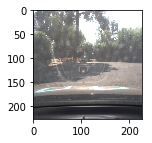

155 [ 0.04448087  0.15395735  0.77380615  0.02775561] [ 0.  0.  1.  0.]
2 2


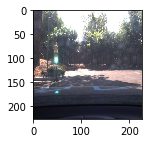

156 [ 0.0180363   0.04826636  0.91976064  0.01393669] [ 0.  0.  1.  0.]
2 2


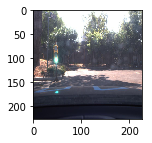

157 [ 0.01878782  0.06872438  0.89866728  0.01382059] [ 0.  0.  1.  0.]
2 2


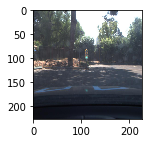

158 [ 0.03731785  0.0615396   0.88294631  0.01819626] [ 0.  0.  1.  0.]
2 2


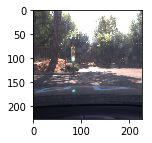

159 [ 0.02117656  0.02891929  0.94126403  0.00864004] [ 0.  0.  1.  0.]
2 2


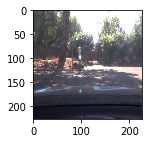

160 [ 0.04084321  0.03594903  0.9098528   0.01335488] [ 0.  0.  1.  0.]
2 2


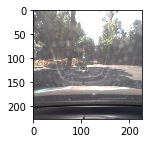

161 [ 0.05836209  0.10112806  0.82285154  0.01765824] [ 0.  0.  1.  0.]
2 2


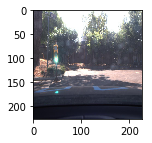

162 [ 0.01852917  0.05577381  0.91302353  0.01267354] [ 0.  0.  1.  0.]
2 2


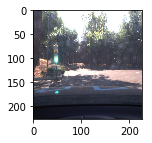

163 [ 0.01967277  0.06555026  0.90055776  0.01421925] [ 0.  0.  1.  0.]
2 2


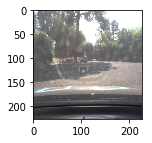

164 [ 0.03939166  0.11745704  0.81697237  0.02617895] [ 0.  0.  1.  0.]
2 2


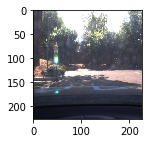

165 [ 0.01413455  0.03587752  0.93934184  0.01064609] [ 0.  0.  1.  0.]
2 2


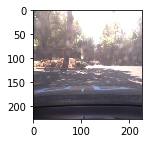

166 [ 0.06067844  0.036153    0.87671828  0.02645019] [ 0.  0.  1.  0.]
2 2


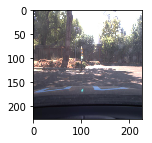

167 [ 0.02877425  0.02228278  0.93822765  0.0107154 ] [ 0.  0.  1.  0.]
2 2


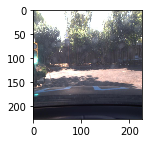

168 [ 0.05073227  0.08862276  0.81355762  0.04708742] [ 0.  0.  1.  0.]
2 2


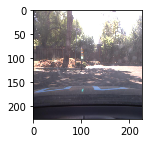

169 [ 0.03142226  0.01950259  0.93832076  0.01075449] [ 0.  0.  1.  0.]
2 2


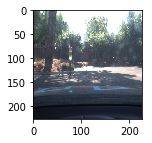

170 [ 0.02247965  0.02486734  0.94344532  0.00920768] [ 0.  0.  1.  0.]
2 2


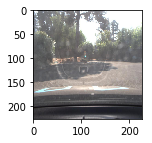

171 [ 0.03998058  0.11965944  0.81376052  0.0265994 ] [ 0.  0.  1.  0.]
2 2


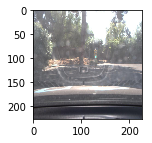

172 [ 0.08495427  0.07532515  0.81525731  0.02446331] [ 0.  0.  1.  0.]
2 2


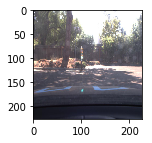

173 [ 0.02576236  0.0198325   0.94435167  0.01005346] [ 0.  0.  1.  0.]
2 2


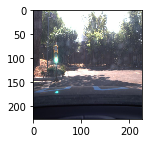

174 [ 0.01778287  0.04646529  0.92358291  0.01216903] [ 0.  0.  1.  0.]
2 2


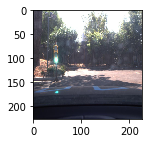

175 [ 0.01810676  0.05370796  0.91521889  0.01296644] [ 0.  0.  1.  0.]
2 2


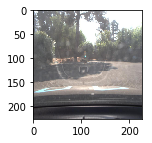

176 [ 0.03820931  0.11926428  0.81655574  0.0259706 ] [ 0.  0.  1.  0.]
2 2


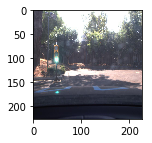

177 [ 0.01723824  0.04402466  0.92573637  0.01300077] [ 0.  0.  1.  0.]
2 2


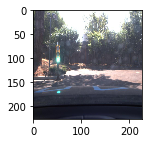

178 [ 0.01764806  0.03886732  0.93282306  0.01066163] [ 0.  0.  1.  0.]
2 2


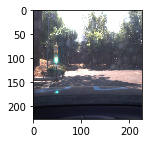

179 [ 0.01791335  0.048758    0.9207601   0.01256857] [ 0.  0.  1.  0.]
2 2


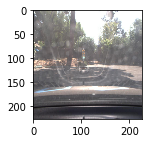

180 [ 0.05120976  0.05681991  0.87707305  0.01489732] [ 0.  0.  1.  0.]
2 2


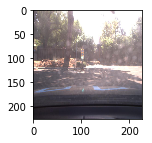

181 [ 0.04445224  0.0309763   0.90771157  0.01685994] [ 0.  0.  1.  0.]
2 2


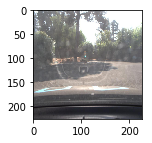

182 [ 0.04117857  0.12349916  0.80854279  0.02677944] [ 0.  0.  1.  0.]
2 2


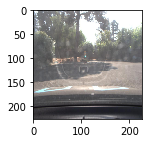

183 [ 0.04314988  0.12777245  0.80205154  0.0270262 ] [ 0.  0.  1.  0.]
2 2


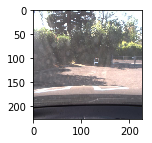

184 [ 0.0175492   0.01812888  0.0186524   0.94566953] [ 0.  0.  0.  1.]
3 3


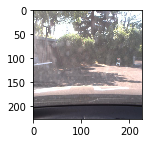

185 [ 0.02547137  0.02793578  0.04791752  0.89867538] [ 0.  0.  0.  1.]
3 3


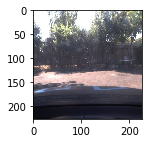

186 [ 0.0193507   0.02228065  0.02891883  0.9294498 ] [ 0.  0.  0.  1.]
3 3


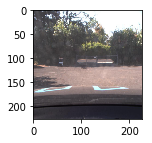

187 [ 0.01337941  0.01908472  0.01356604  0.95396984] [ 0.  0.  0.  1.]
3 3


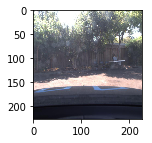

188 [ 0.01434132  0.01955699  0.01355419  0.95254755] [ 0.  0.  0.  1.]
3 3


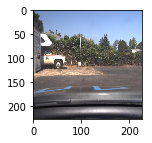

189 [ 0.01259176  0.01446068  0.01284129  0.96010631] [ 0.  0.  0.  1.]
3 3


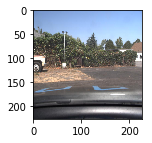

190 [ 0.01188315  0.01349797  0.01299365  0.96162522] [ 0.  0.  0.  1.]
3 3


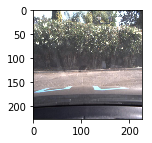

191 [ 0.02511917  0.0208534   0.01849265  0.93553478] [ 0.  0.  0.  1.]
3 3


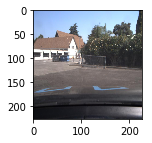

192 [ 0.0134495   0.01811323  0.01534603  0.95309126] [ 0.  0.  0.  1.]
3 3


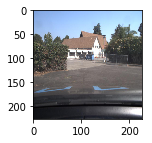

193 [ 0.01812495  0.02635483  0.01736353  0.93815672] [ 0.  0.  0.  1.]
3 3


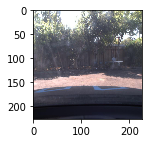

194 [ 0.0173704   0.0245058   0.0197532   0.93837059] [ 0.  0.  0.  1.]
3 3


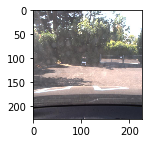

195 [ 0.0130422   0.0137537   0.01326837  0.95993578] [ 0.  0.  0.  1.]
3 3


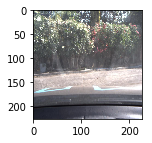

196 [ 0.01425533  0.01520216  0.01348938  0.95705312] [ 0.  0.  0.  1.]
3 3


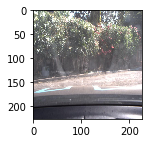

197 [ 0.01126297  0.01203156  0.01165851  0.96504694] [ 0.  0.  0.  1.]
3 3


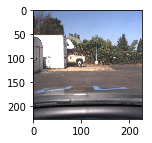

198 [ 0.0180171   0.01868002  0.0155752   0.94772768] [ 0.  0.  0.  1.]
3 3


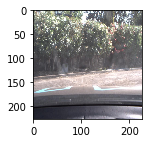

199 [ 0.01586148  0.01581829  0.01471349  0.95360678] [ 0.  0.  0.  1.]
3 3


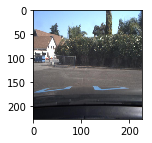

200 [ 0.01340792  0.01777465  0.01462149  0.95419598] [ 0.  0.  0.  1.]
3 3


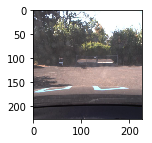

201 [ 0.01333047  0.01900281  0.01358682  0.95407987] [ 0.  0.  0.  1.]
3 3


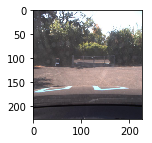

202 [ 0.01307415  0.01852071  0.01341281  0.95499235] [ 0.  0.  0.  1.]
3 3


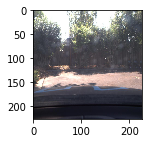

203 [ 0.01427467  0.02071732  0.01589864  0.94910932] [ 0.  0.  0.  1.]
3 3


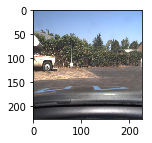

204 [ 0.01220984  0.01352812  0.01336329  0.96089882] [ 0.  0.  0.  1.]
3 3


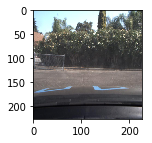

205 [ 0.01399768  0.01978387  0.01408023  0.95213819] [ 0.  0.  0.  1.]
3 3


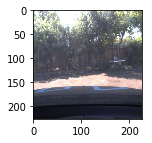

206 [ 0.0134503   0.01821468  0.01337181  0.95496321] [ 0.  0.  0.  1.]
3 3


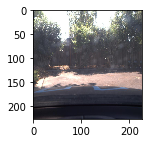

207 [ 0.01444464  0.02067052  0.01636748  0.94851738] [ 0.  0.  0.  1.]
3 3


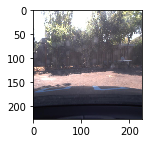

208 [ 0.02971756  0.03151575  0.04758129  0.8911854 ] [ 0.  0.  0.  1.]
3 3


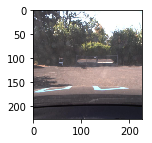

209 [ 0.013169    0.01926159  0.01353322  0.95403612] [ 0.  0.  0.  1.]
3 3


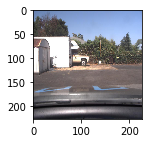

210 [ 0.01645874  0.01816723  0.01490423  0.95046979] [ 0.  0.  0.  1.]
3 3


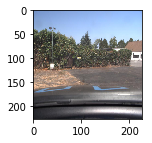

211 [ 0.01201108  0.01426523  0.0124673   0.96125644] [ 0.  0.  0.  1.]
3 3


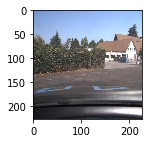

212 [ 0.01322783  0.01547349  0.01349294  0.95780569] [ 0.  0.  0.  1.]
3 3


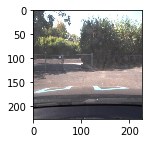

213 [ 0.02014048  0.01859022  0.01612075  0.94514853] [ 0.  0.  0.  1.]
3 3


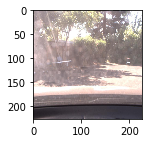

214 [ 0.01678198  0.01797025  0.02592219  0.93932563] [ 0.  0.  0.  1.]
3 3


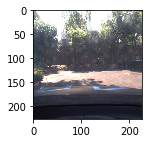

215 [ 0.04945455  0.09461704  0.17465596  0.68127239] [ 0.  0.  0.  1.]
3 3


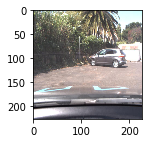

216 [ 0.0152297   0.0157654   0.01465154  0.95435339] [ 0.  0.  0.  1.]
3 3


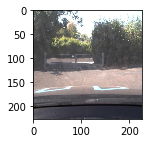

217 [ 0.02528989  0.01948227  0.01965127  0.93557662] [ 0.  0.  0.  1.]
3 3


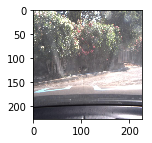

218 [ 0.01080326  0.01236073  0.01254088  0.96429515] [ 0.  0.  0.  1.]
3 3


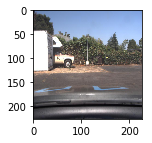

219 [ 0.01400784  0.02062205  0.01468884  0.95068127] [ 0.  0.  0.  1.]
3 3


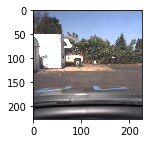

220 [ 0.01569984  0.01724836  0.01519898  0.95185274] [ 0.  0.  0.  1.]
3 3


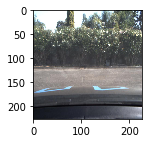

221 [ 0.0154533   0.01694866  0.01568844  0.9519096 ] [ 0.  0.  0.  1.]
3 3


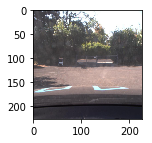

222 [ 0.01311435  0.01851125  0.01341493  0.95495939] [ 0.  0.  0.  1.]
3 3


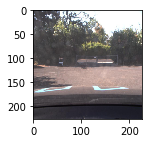

223 [ 0.01327797  0.01873404  0.01351545  0.95447254] [ 0.  0.  0.  1.]
3 3


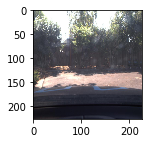

224 [ 0.01750681  0.02894022  0.02288361  0.93066937] [ 0.  0.  0.  1.]
3 3


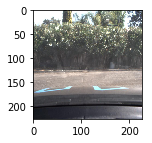

225 [ 0.01970179  0.02104545  0.01726564  0.9419871 ] [ 0.  0.  0.  1.]
3 3


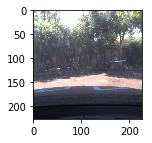

226 [ 0.01442783  0.020676    0.01899658  0.94589955] [ 0.  0.  0.  1.]
3 3


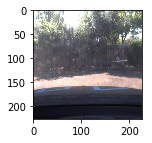

227 [ 0.01298988  0.01832416  0.01326817  0.95541775] [ 0.  0.  0.  1.]
3 3


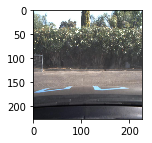

228 [ 0.01812865  0.02340519  0.01601864  0.94244754] [ 0.  0.  0.  1.]
3 3


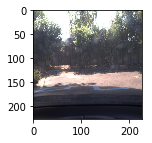

229 [ 0.0139773   0.02100811  0.01549351  0.94952112] [ 0.  0.  0.  1.]
3 3


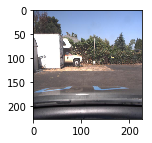

230 [ 0.01662381  0.01669062  0.01494306  0.95174253] [ 0.  0.  0.  1.]
3 3


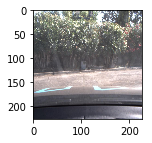

231 [ 0.02844739  0.0196342   0.01750855  0.93440992] [ 0.  0.  0.  1.]
3 3


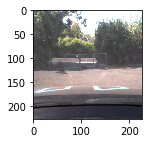

232 [ 0.02270487  0.01921546  0.0203736   0.93770611] [ 0.  0.  0.  1.]
3 3


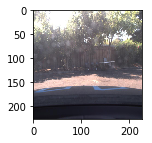

233 [ 0.0344003   0.03469846  0.04214201  0.8887592 ] [ 0.  0.  0.  1.]
3 3


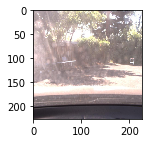

234 [ 0.01418094  0.01424787  0.02034618  0.95122504] [ 0.  0.  0.  1.]
3 3


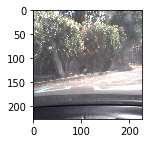

235 [ 0.01109855  0.01245036  0.01176416  0.96468693] [ 0.  0.  0.  1.]
3 3


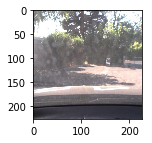

236 [ 0.02443931  0.02727319  0.03932717  0.90896034] [ 0.  0.  0.  1.]
3 3


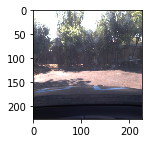

237 [ 0.03333912  0.08085797  0.03696275  0.84884012] [ 0.  0.  0.  1.]
3 3


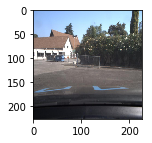

238 [ 0.01355415  0.01805572  0.01548397  0.95290613] [ 0.  0.  0.  1.]
3 3


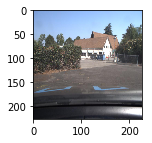

239 [ 0.0160688   0.02271696  0.01681356  0.94440067] [ 0.  0.  0.  1.]
3 3


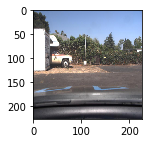

240 [ 0.01381622  0.01664549  0.01442105  0.95511729] [ 0.  0.  0.  1.]
3 3


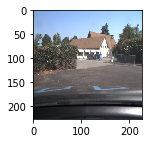

241 [ 0.01884301  0.02795541  0.01781007  0.93539155] [ 0.  0.  0.  1.]
3 3


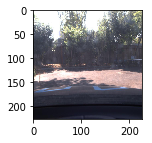

242 [ 0.03415825  0.06786945  0.05436107  0.84361124] [ 0.  0.  0.  1.]
3 3


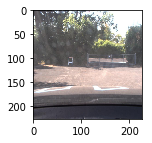

243 [ 0.01734578  0.01876256  0.01700508  0.94688654] [ 0.  0.  0.  1.]
3 3


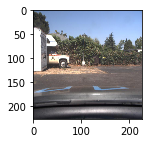

244 [ 0.01304939  0.01621666  0.01346451  0.95726949] [ 0.  0.  0.  1.]
3 3


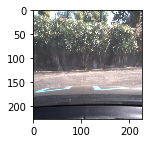

245 [ 0.0192932   0.01673443  0.01553985  0.94843256] [ 0.  0.  0.  1.]
3 3


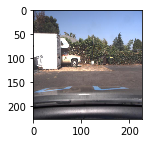

246 [ 0.01798376  0.01831426  0.01629294  0.94740903] [ 0.  0.  0.  1.]
3 3


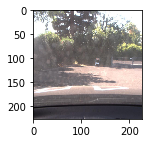

247 [ 0.02186582  0.021821    0.02384915  0.93246406] [ 0.  0.  0.  1.]
3 3


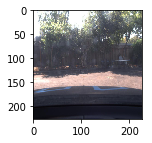

248 [ 0.01632627  0.01911012  0.01409046  0.95047313] [ 0.  0.  0.  1.]
3 3


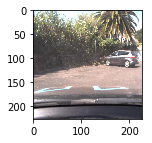

249 [ 0.01942215  0.01888189  0.0165871   0.94510889] [ 0.  0.  0.  1.]
3 3


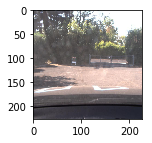

250 [ 0.01229922  0.01337842  0.01280592  0.96151644] [ 0.  0.  0.  1.]
3 3


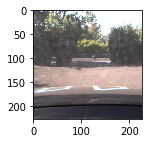

251 [ 0.01377467  0.01543986  0.01586427  0.95492113] [ 0.  0.  0.  1.]
3 3


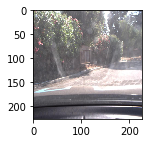

252 [ 0.0270701   0.02698145  0.02329227  0.92265618] [ 0.  0.  0.  1.]
3 3


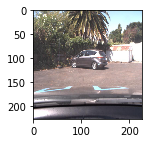

253 [ 0.01525544  0.01824849  0.01637025  0.95012587] [ 0.  0.  0.  1.]
3 3


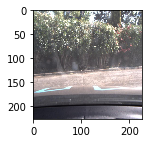

254 [ 0.01886072  0.01649294  0.01483751  0.94980884] [ 0.  0.  0.  1.]
3 3


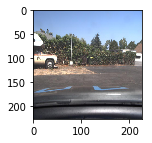

255 [ 0.01178284  0.01334378  0.01257375  0.96229959] [ 0.  0.  0.  1.]
3 3


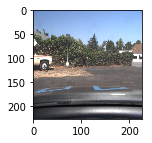

256 [ 0.01164316  0.01302861  0.01238019  0.96294802] [ 0.  0.  0.  1.]
3 3


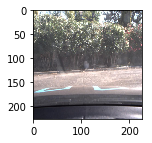

257 [ 0.03114729  0.02069354  0.01917862  0.92898053] [ 0.  0.  0.  1.]
3 3


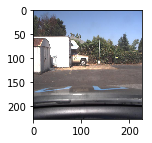

258 [ 0.01499654  0.01884928  0.014443    0.95171118] [ 0.  0.  0.  1.]
3 3


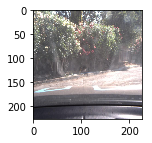

259 [ 0.01290983  0.01629231  0.01281127  0.95798665] [ 0.  0.  0.  1.]
3 3


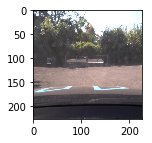

260 [ 0.01243416  0.0169572   0.01289911  0.95770949] [ 0.  0.  0.  1.]
3 3


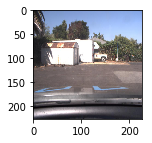

261 [ 0.01608175  0.02048906  0.01815121  0.94527793] [ 0.  0.  0.  1.]
3 3


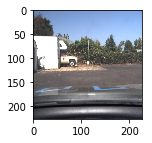

262 [ 0.01447116  0.01712098  0.01430306  0.95410484] [ 0.  0.  0.  1.]
3 3


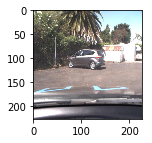

263 [ 0.01488631  0.01743198  0.01464854  0.95303309] [ 0.  0.  0.  1.]
3 3


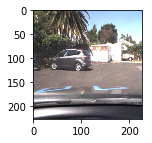

264 [ 0.01892372  0.01832243  0.01718041  0.94557339] [ 0.  0.  0.  1.]
3 3


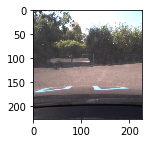

265 [ 0.01416455  0.01863369  0.0143917   0.95280999] [ 0.  0.  0.  1.]
3 3


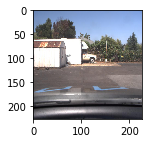

266 [ 0.0128247   0.01568908  0.01384013  0.95764607] [ 0.  0.  0.  1.]
3 3


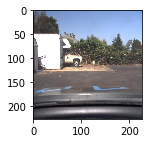

267 [ 0.01807484  0.0182103   0.01599917  0.9477157 ] [ 0.  0.  0.  1.]
3 3


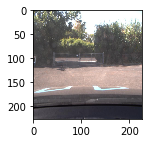

268 [ 0.01462241  0.01497917  0.01408668  0.95631176] [ 0.  0.  0.  1.]
3 3


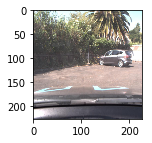

269 [ 0.01884613  0.01871118  0.01709898  0.94534373] [ 0.  0.  0.  1.]
3 3


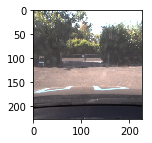

270 [ 0.01389323  0.01510268  0.01445365  0.95655048] [ 0.  0.  0.  1.]
3 3


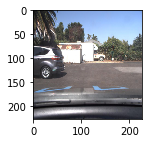

271 [ 0.01260559  0.01475437  0.01323438  0.95940572] [ 0.  0.  0.  1.]
3 3


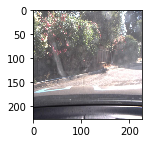

272 [ 0.01357     0.01918798  0.01696271  0.95027936] [ 0.  0.  0.  1.]
3 3


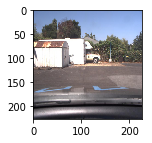

273 [ 0.01286656  0.01506021  0.01405358  0.95801967] [ 0.  0.  0.  1.]
3 3


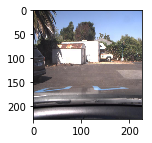

274 [ 0.01719716  0.02205336  0.01758566  0.94316375] [ 0.  0.  0.  1.]
3 3


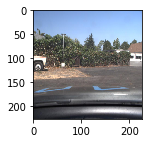

275 [ 0.01242154  0.01491819  0.01386177  0.95879853] [ 0.  0.  0.  1.]
3 3


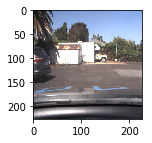

276 [ 0.01283647  0.01660897  0.01379111  0.95676345] [ 0.  0.  0.  1.]
3 3


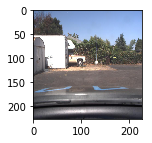

277 [ 0.01771287  0.01983941  0.01598977  0.94645792] [ 0.  0.  0.  1.]
3 3


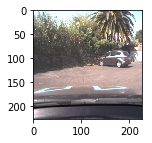

278 [ 0.01572521  0.01786419  0.01553832  0.9508723 ] [ 0.  0.  0.  1.]
3 3


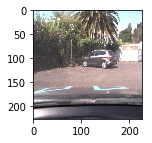

279 [ 0.01515273  0.01617744  0.01605895  0.95261091] [ 0.  0.  0.  1.]
3 3


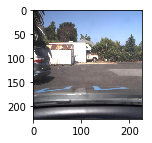

280 [ 0.01220579  0.01711434  0.01306072  0.95761919] [ 0.  0.  0.  1.]
3 3


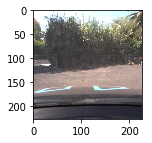

281 [ 0.01510477  0.01615583  0.01386747  0.95487189] [ 0.  0.  0.  1.]
3 3


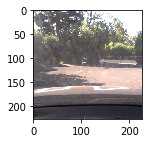

282 [ 0.01661868  0.01827989  0.01600619  0.94909525] [ 0.  0.  0.  1.]
3 3


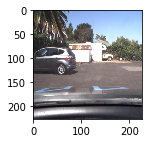

283 [ 0.01338193  0.01550769  0.01512187  0.95598853] [ 0.  0.  0.  1.]
3 3


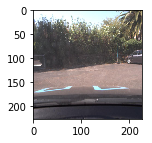

284 [ 0.01446159  0.01626204  0.01385714  0.9554193 ] [ 0.  0.  0.  1.]
3 3


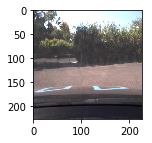

285 [ 0.01297653  0.01683156  0.01361625  0.95657563] [ 0.  0.  0.  1.]
3 3


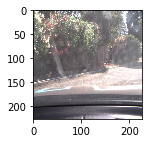

286 [ 0.01146025  0.01621276  0.01312154  0.95920551] [ 0.  0.  0.  1.]
3 3


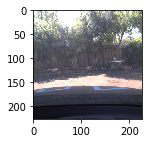

287 [ 0.01245971  0.01745756  0.01349666  0.956586  ] [ 0.  0.  0.  1.]
3 3


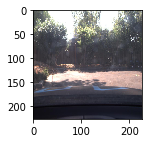

288 [ 0.10491469  0.08084355  0.03973556  0.77450621] [ 0.  0.  0.  1.]
3 3


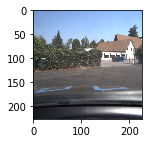

289 [ 0.01212606  0.01622465  0.01255109  0.95909822] [ 0.  0.  0.  1.]
3 3


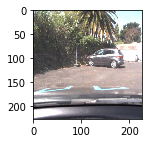

290 [ 0.01505637  0.01581472  0.01469556  0.95443332] [ 0.  0.  0.  1.]
3 3


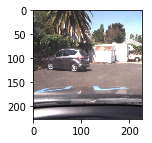

291 [ 0.02618719  0.02945827  0.02138395  0.92297053] [ 0.  0.  0.  1.]
3 3


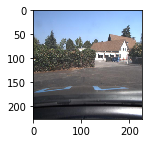

292 [ 0.01400434  0.01864047  0.01429741  0.95305783] [ 0.  0.  0.  1.]
3 3


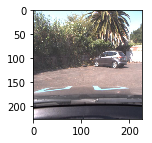

293 [ 0.01581142  0.0169147   0.01512061  0.95215321] [ 0.  0.  0.  1.]
3 3


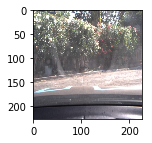

294 [ 0.01302138  0.01318656  0.01299387  0.9607982 ] [ 0.  0.  0.  1.]
3 3


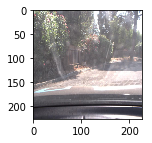

295 [ 0.24373294  0.0579914   0.04134638  0.65692931] [ 0.  0.  0.  1.]
3 3


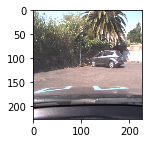

296 [ 0.01566376  0.01668334  0.01554489  0.95210797] [ 0.  0.  0.  1.]
3 3


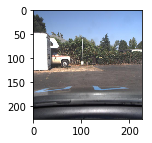

297 [ 0.01390243  0.01455124  0.01402764  0.9575187 ] [ 0.  0.  0.  1.]
3 3


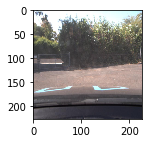

298 [ 0.01491018  0.01511604  0.01383858  0.95613515] [ 0.  0.  0.  1.]
3 3


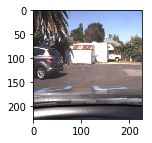

299 [ 0.01362485  0.01679744  0.0141256   0.95545214] [ 0.  0.  0.  1.]
3 3


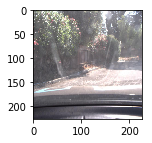

300 [ 0.03488469  0.03032296  0.02781585  0.90697646] [ 0.  0.  0.  1.]
3 3


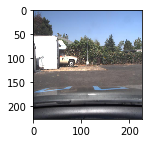

301 [ 0.01388026  0.01666118  0.0140279   0.95543069] [ 0.  0.  0.  1.]
3 3


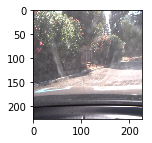

302 [ 0.01888113  0.01953651  0.01864809  0.94293422] [ 0.  0.  0.  1.]
3 3


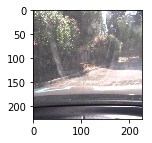

303 [ 0.04498817  0.03064662  0.03701923  0.88734603] [ 0.  0.  0.  1.]
3 3


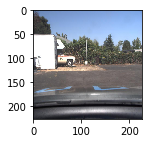

304 [ 0.01370811  0.01621484  0.01422241  0.95585465] [ 0.  0.  0.  1.]
3 3


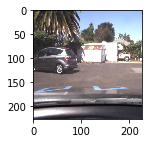

305 [ 0.01474357  0.01676353  0.01601535  0.95247757] [ 0.  0.  0.  1.]
3 3


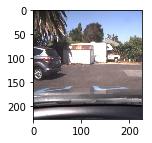

306 [ 0.01266456  0.01613505  0.01329102  0.95790941] [ 0.  0.  0.  1.]
3 3


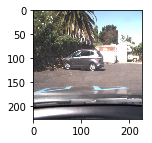

307 [ 0.01758157  0.02093466  0.01681746  0.94466627] [ 0.  0.  0.  1.]
3 3


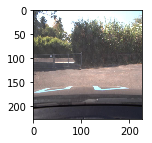

308 [ 0.01476639  0.01583621  0.01379813  0.95559931] [ 0.  0.  0.  1.]
3 3


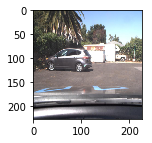

309 [ 0.01418266  0.01731461  0.01494374  0.95355898] [ 0.  0.  0.  1.]
3 3


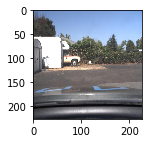

310 [ 0.01398405  0.01687236  0.01387477  0.9552688 ] [ 0.  0.  0.  1.]
3 3


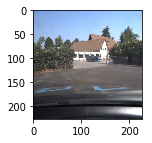

311 [ 0.01425697  0.01866872  0.0157727   0.95130163] [ 0.  0.  0.  1.]
3 3


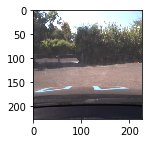

312 [ 0.01303685  0.01698962  0.01370511  0.95626837] [ 0.  0.  0.  1.]
3 3


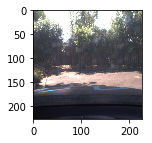

313 [ 0.01606554  0.02382573  0.01969642  0.94041234] [ 0.  0.  0.  1.]
3 3


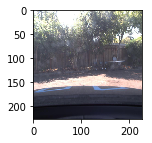

314 [ 0.01223834  0.01654421  0.01292274  0.95829469] [ 0.  0.  0.  1.]
3 3


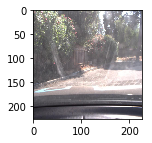

315 [ 0.0455358   0.03160753  0.04012056  0.88273615] [ 0.  0.  0.  1.]
3 3


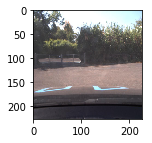

316 [ 0.01352977  0.01771229  0.01400433  0.95475358] [ 0.  0.  0.  1.]
3 3


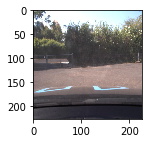

317 [ 0.01317244  0.01655557  0.01383126  0.95644075] [ 0.  0.  0.  1.]
3 3


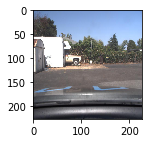

318 [ 0.01501146  0.0193761   0.01454703  0.95106542] [ 0.  0.  0.  1.]
3 3


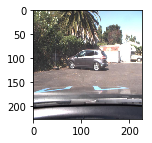

319 [ 0.01981805  0.02179688  0.01759558  0.94078952] [ 0.  0.  0.  1.]
3 3


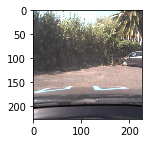

320 [ 0.02081941  0.01939352  0.01625863  0.94352847] [ 0.  0.  0.  1.]
3 3


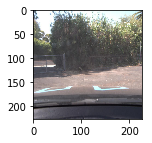

321 [ 0.03548394  0.0326022   0.0207362   0.91117769] [ 0.  0.  0.  1.]
3 3


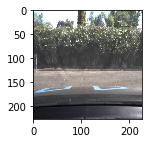

322 [ 0.01811674  0.02109075  0.0161811   0.94461137] [ 0.  0.  0.  1.]
3 3


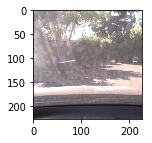

323 [ 0.02818756  0.02905415  0.04014852  0.90260977] [ 0.  0.  0.  1.]
3 3


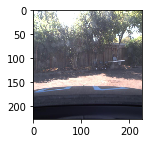

324 [ 0.01253222  0.01660465  0.01260555  0.95825762] [ 0.  0.  0.  1.]
3 3


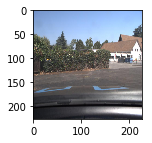

325 [ 0.01238373  0.01393394  0.01270124  0.96098113] [ 0.  0.  0.  1.]
3 3


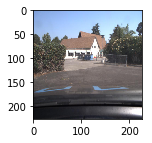

326 [ 0.01758465  0.02525694  0.01772188  0.9394365 ] [ 0.  0.  0.  1.]
3 3


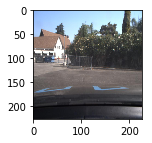

327 [ 0.01285092  0.01643278  0.01401632  0.95670003] [ 0.  0.  0.  1.]
3 3


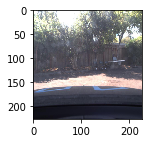

328 [ 0.01289054  0.01671178  0.01282145  0.95757622] [ 0.  0.  0.  1.]
3 3


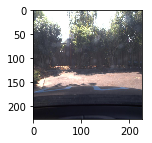

329 [ 0.01531304  0.02218759  0.02131699  0.94118237] [ 0.  0.  0.  1.]
3 3


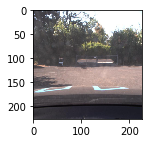

330 [ 0.01338578  0.01912348  0.01363988  0.95385087] [ 0.  0.  0.  1.]
3 3


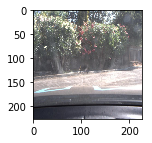

331 [ 0.01280111  0.01469239  0.01339072  0.9591158 ] [ 0.  0.  0.  1.]
3 3


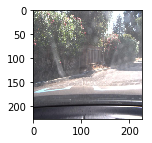

332 [ 0.01776681  0.01556317  0.01779247  0.94887757] [ 0.  0.  0.  1.]
3 3


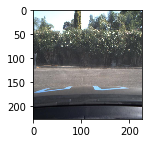

333 [ 0.01505492  0.01592391  0.01442747  0.95459372] [ 0.  0.  0.  1.]
3 3


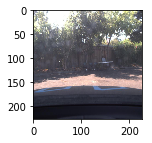

334 [ 0.02274982  0.02725755  0.03199755  0.9179951 ] [ 0.  0.  0.  1.]
3 3


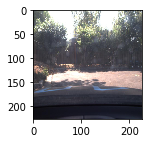

335 [ 0.0481708   0.04879012  0.036325    0.86671406] [ 0.  0.  0.  1.]
3 3


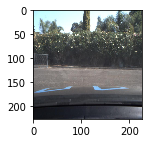

336 [ 0.0159851   0.01704128  0.01645434  0.95051926] [ 0.  0.  0.  1.]
3 3


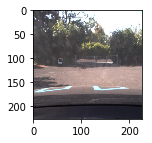

337 [ 0.01300974  0.01810584  0.01327442  0.95560998] [ 0.  0.  0.  1.]
3 3


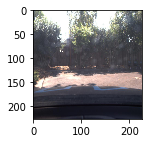

338 [ 0.01886496  0.02969792  0.02649193  0.92494518] [ 0.  0.  0.  1.]
3 3


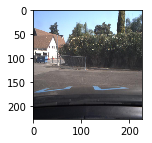

339 [ 0.01323739  0.01761476  0.01451431  0.95463347] [ 0.  0.  0.  1.]
3 3


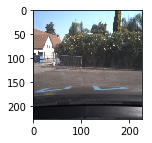

340 [ 0.0138941   0.01897533  0.01516811  0.95196241] [ 0.  0.  0.  1.]
3 3


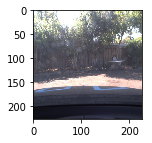

341 [ 0.0123639   0.01725355  0.0133006   0.95708197] [ 0.  0.  0.  1.]
3 3


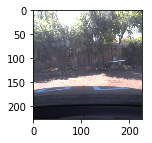

342 [ 0.01342812  0.01712673  0.01291031  0.95653486] [ 0.  0.  0.  1.]
3 3


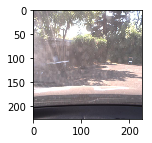

343 [ 0.03124553  0.03539045  0.03856387  0.89480013] [ 0.  0.  0.  1.]
3 3


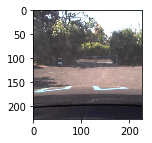

344 [ 0.01321704  0.01873362  0.01350321  0.95454615] [ 0.  0.  0.  1.]
3 3


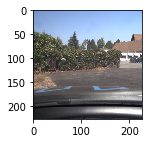

345 [ 0.01236827  0.01438909  0.01280249  0.96044016] [ 0.  0.  0.  1.]
3 3


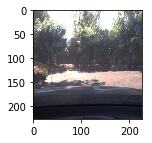

346 [ 0.06761538  0.06273991  0.04952619  0.82011849] [ 0.  0.  0.  1.]
3 3


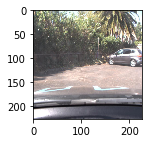

347 [ 0.01962425  0.01949197  0.016882    0.94400173] [ 0.  0.  0.  1.]
3 3


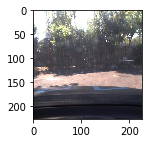

348 [ 0.02307555  0.02444264  0.03255294  0.91992891] [ 0.  0.  0.  1.]
3 3


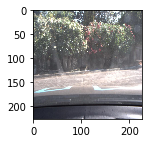

349 [ 0.01483238  0.01544089  0.01598642  0.95374036] [ 0.  0.  0.  1.]
3 3


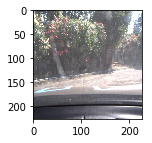

350 [ 0.01083002  0.01251334  0.01198647  0.96467018] [ 0.  0.  0.  1.]
3 3


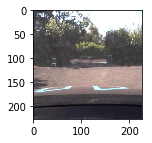

351 [ 0.01347655  0.01783976  0.01345394  0.95522976] [ 0.  0.  0.  1.]
3 3


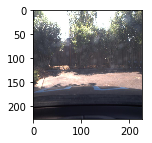

352 [ 0.01598456  0.02258186  0.01737242  0.9440611 ] [ 0.  0.  0.  1.]
3 3


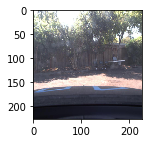

353 [ 0.01278978  0.01723901  0.01263651  0.9573347 ] [ 0.  0.  0.  1.]
3 3


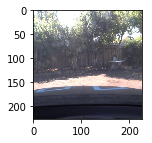

354 [ 0.01277496  0.0179358   0.01371751  0.95557177] [ 0.  0.  0.  1.]
3 3


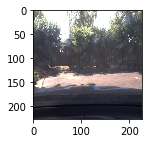

355 [ 0.02043338  0.0311222   0.02825756  0.92018694] [ 0.  0.  0.  1.]
3 3


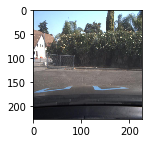

356 [ 0.01421549  0.02010503  0.01454837  0.95113111] [ 0.  0.  0.  1.]
3 3


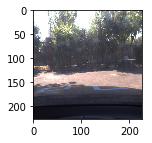

357 [ 0.01509184  0.0190158   0.01489209  0.95100027] [ 0.  0.  0.  1.]
3 3


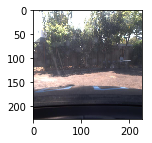

358 [ 0.0200506   0.02402049  0.03682689  0.91910201] [ 0.  0.  0.  1.]
3 3


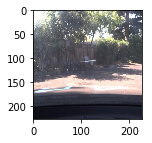

359 [ 0.01570394  0.01908267  0.01784872  0.94736463] [ 0.  0.  0.  1.]
3 3


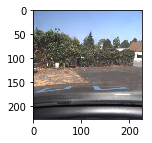

360 [ 0.01227546  0.01393223  0.01273197  0.96106029] [ 0.  0.  0.  1.]
3 3


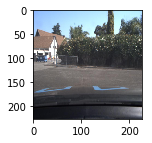

361 [ 0.01320506  0.01813996  0.01458165  0.95407337] [ 0.  0.  0.  1.]
3 3


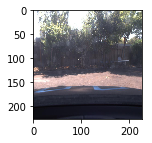

362 [ 0.02043111  0.02247912  0.01789713  0.93919271] [ 0.  0.  0.  1.]
3 3


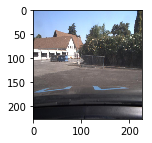

363 [ 0.01341211  0.01885452  0.01516346  0.9525699 ] [ 0.  0.  0.  1.]
3 3


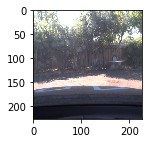

364 [ 0.01276205  0.01716886  0.01350141  0.9565677 ] [ 0.  0.  0.  1.]
3 3


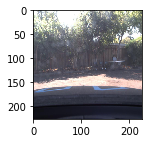

365 [ 0.0129463   0.01792889  0.013879    0.95524585] [ 0.  0.  0.  1.]
3 3


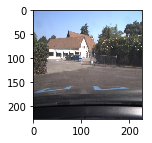

366 [ 0.0141543   0.01821067  0.01597232  0.95166272] [ 0.  0.  0.  1.]
3 3


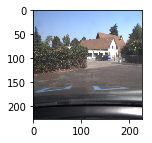

367 [ 0.01737002  0.02123842  0.01767638  0.94371521] [ 0.  0.  0.  1.]
3 3


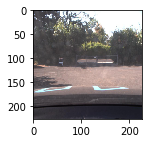

368 [ 0.01330567  0.0189024   0.0136045   0.95418739] [ 0.  0.  0.  1.]
3 3


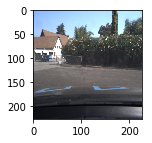

369 [ 0.01256513  0.01654011  0.01372983  0.95716494] [ 0.  0.  0.  1.]
3 3


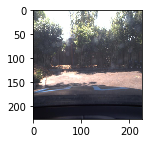

370 [ 0.01431617  0.02551692  0.01617102  0.94399589] [ 0.  0.  0.  1.]
3 3


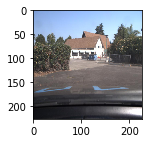

371 [ 0.016614    0.02556579  0.0164255   0.94139469] [ 0.  0.  0.  1.]
3 3


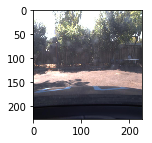

372 [ 0.01491038  0.02352147  0.01415085  0.94741732] [ 0.  0.  0.  1.]
3 3
0.9946380697050938


In [32]:
prediction = model.predict(X_test, verbose=1)
num_correct = 0
for i in range(len(prediction)):
    file = X_test[i]
    plt.figure(figsize=(2,2))
    plt.imshow(file)
    plt.show()
    print (i, prediction[i], categorical_test_labels[i])
    prediction_val = np.argmax(prediction[i])
    actual_val = np.argmax(categorical_test_labels[i])
    print(prediction_val, actual_val)
    if prediction_val == actual_val:
        num_correct +=1
print(num_correct/len(prediction))

In [33]:
model.save('carla-classifier.h5')